# 문제 
U-Net을 이용해 축구 경기 영상 내의 다양한 객체(예: 골대, 심판, 선수, 관중 등)를 픽셀 단위로 분할하는 Semantic Segmentation 작업을 수행

실제 경기 장면에서 추출한 이미지를 바탕으로, 각 픽셀이 어떤 클래스에 속하는지 예측하는 모델을 직접 설계하고 학습

# 데이터 소개
데이터 링크: https://www.kaggle.com/datasets/sadhliroomyprime/football-semantic-segmentation

**데이터 구성**
- 본 데이터셋은 UEFA 슈퍼컵 2017 레알 마드리드 vs 맨체스터 유나이티드 경기 하이라이트 영상을 기반으로 수집된 축구 경기 장면들로 구성되어 있습니다. 총 100장의 프레임을 사용하였으며, 매 12번째 프레임을 추출해 흐릿한 장면이나 이상치는 일부 대체했습니다.
11개 클래스가 포함되어 있습니다.

- Goal Bar (골대)
- Referee (심판)
- Advertisement (광고판)
- Ground (잔디)
- Ball (축구공)
- Coaches & Officials (코칭 스태프 및 심판진)
- Audience (관중)
- Goalkeeper A (팀 A 골키퍼)
- Goalkeeper B (팀 B 골키퍼)
- Team A (팀 A 선수)
- Team B (팀 B 선수)

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import tensorflow as tf
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.utils import plot_model
from tqdm import tqdm

# Model
from keras.layers import add, Input, Layer, Conv2D, multiply, Dropout, MaxPool2D, Concatenate, Conv2DTranspose, BatchNormalization, Activation
from keras.callbacks import Callback, ModelCheckpoint, EarlyStopping
from keras.optimizers import Adam

import glob,cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import torch.optim as optim

# from unet_model_with_functions_of_blocks import build_unet

import warnings
warnings.filterwarnings("ignore")

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

## 전처리

### 파일 불러오기

In [8]:
# # Football_Segmentation/
# #  ├── images/
# #  ├── About Acme AI.txt
# #  └── COCO_Football Pixel.json

# # COCO_Football Pixel.json
#     "info": {
#         "description": "This is dataset.",
#         "url": "https://superannotate.ai",
#         "version": "1.0",
#         "year": 2022,
#         "contributor": "Superannotate AI",
#         "date_created": "23/11/2022"
#     },
#     "licenses": [
#         {
#             "url": "https://superannotate.ai",
#             "id": 1,
#             "name": "Superannotate AI"
#         }
#     ],
#     "images": [
#         {
#             "id": 1,
#             "file_name": "Frame 1  (14).jpg",
#             "height": 1080,
#             "width": 1920,
#             "license": 1
#         },
#         {
#             "id": 2,
#             "file_name": "Frame 1  (12).jpg",
#             "height": 1080,
#             "width": 1920,
#             "license": 1
#     "info": {
#         "description": "This is dataset.",
#         "url": "https://superannotate.ai",
#         "version": "1.0",
#         "year": 2022,
#         "contributor": "Superannotate AI",
#         "date_created": "23/11/2022"
#     },
#     "licenses": [
#         {
#             "url": "https://superannotate.ai",
#             "id": 1,
#             "name": "Superannotate AI"
#         }
#     ],
#     "images": [
#         {
#             "id": 1,
#             "file_name": "Frame 1  (14).jpg",
#             "height": 1080,
#             "width": 1920,
#             "license": 1
#         },
#         {
#             "id": 2,
#             "file_name": "Frame 1  (12).jpg",
#             "height": 1080,
#             "width": 1920,
#             "license": 1

#             .
#             .
#             .

#             {"id": 100...}]
            
#     "annotations": [
#         {
#             "id": 1,
#             "image_id": 1,
#             "segmentation": [
#                 [
#                     1035,
#                     366,...]
#             "iscrowd": 0,
#             "bbox": [
#                 802.0,
#                 366.0,
#                 326.0,
#                 714.0
#             ],
#             "area": 87773,
#             "category_id": 1392794
#         }
#                 .
#                 .
#                 .

In [9]:
folder_paths = "./Football_Segmentation/"
image_paths = os.path.join(folder_paths,"images")
image_lists = os.listdir(image_paths)   # 이미지 폴더에 있는 파일 목록 가져오기

len(image_lists)

300

In [10]:
# valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff', '.webp')
# non_images = [f for f in image_list if not f.lower().endswith(valid_extensions)]
# print(non_images)

In [11]:
# ds_store_path = os.path.join(image_path, ".DS_Store")

# # if os.path.exists(ds_store_path):
#     os.remove(ds_store_path)
#     print(".DS_Store 삭제 완료")
# else:
#     print(".DS_Store 없음")

In [12]:
# from collections import Counter
# ext_counter = Counter([os.path.splitext(f)[1].lower() for f in image_list])
# print(ext_counter)

In [13]:
# 원본 이미지 경로(.jpg)
original_files = sorted([f for f in image_lists if f.endswith(".jpg")])

# 대응하는 마스크 경로(.jpg___fuse.png)
fuse_files = sorted([f for f in image_lists if "fuse" in f])

# 이렇게 한 이유?
# 1. 데이터셋이 정해진 규칙에 따라 마스크 이미지의 이름이 만들어졌기에 → 마스크 파일명 = 원본 이미지 이름 + ___fuse.png
# 2. 간단하게 경로 매칭을 하기 위함. → "이미지 경로 → 대응하는 마스크 경로"

# 만약 원본 이미지와 마스크 이미지가 각각 다른 폴더에 있을 때는 다른 방법을 사용해야함.

In [14]:
len(original_files), len(fuse_files)

(100, 100)

### 이미지 매칭

In [16]:
SIZE=256
n_classes = 12

In [17]:
paired_image = []
for original_file in original_files:
    base_name = original_file.replace(".jpg", "")
    fuse_file = next((f for f in fuse_files if base_name in f), None)

    if fuse_file:
        img_path = os.path.join(image_paths, original_file)
        mask_path = os.path.join(image_paths, fuse_file)
        paired_image.append((img_path, mask_path))

print(f"{len(paired_image)} pairs")

100 pairs


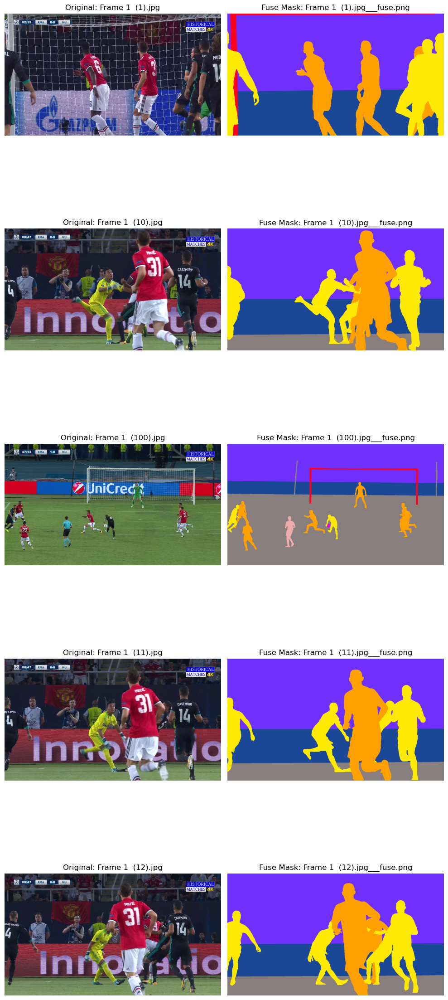

In [18]:
sample_image_pairs = []
num_samples = 5

for original_file in original_files[:num_samples]:
    base_name = original_file.replace(".jpg", "")
    fuse_file = next((f for f in fuse_files if base_name in f), None)

    if fuse_file:
        sample_image_pairs.append((original_file, fuse_file))

# 이미지 5쌍 시각화
fig, axes = plt.subplots(num_samples, 2, figsize=(10, 5 * num_samples))

for i, (original_file, fuse_file) in enumerate(sample_image_pairs):
    # 이미지 로드
    original_img = cv2.imread(os.path.join(image_paths, original_file))
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # OpenCV BGR → RGB 변환

    fuse_img = cv2.imread(os.path.join(image_paths, fuse_file))
    fuse_img = cv2.cvtColor(fuse_img, cv2.COLOR_BGR2RGB)  # 마스크도 RGB 변환

    # 시각화
    axes[i, 0].imshow(original_img)
    axes[i, 0].set_title(f"Original: {original_file}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(fuse_img)
    axes[i, 1].set_title(f"Fuse Mask: {fuse_file}")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()

In [19]:
# 데이터셋 전체의 고유한 색상 수집
def get_unique_colors(image_folder, mask_files, max_classes=11):
    color_set = set()

    for mask_file in mask_files:
        mask_path = os.path.join(image_paths, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        unique_colors = np.unique(mask.reshape(-1, 3), axis=0)

        for color in unique_colors:
            color_set.add(tuple(color))  # 고유한 색상 저장

            # 클래스 개수가 max_classes개가 되면 중단
            if len(color_set) >= max_classes:
                return list(color_set)  # 최대 max_classes개까지만 반환

    return list(color_set)  # 모든 마스크를 순회 후 반환

# 모든 마스크에서 등장하는 색상 수집
unique_colors = get_unique_colors(image_paths, fuse_files)
color_to_label = {color: idx for idx, color in enumerate(unique_colors)}

In [20]:
sorted_color_to_label = dict(sorted(color_to_label.items(), key=lambda x: x[1], reverse=False))
for k, v in sorted_color_to_label.items():
    print(f"클래스: {v}, 색상 코드: {k}")

클래스: 0, 색상 코드: (238, 171, 171)
클래스: 1, 색상 코드: (254, 233, 3)
클래스: 2, 색상 코드: (0, 0, 0)
클래스: 3, 색상 코드: (255, 0, 29)
클래스: 4, 색상 코드: (111, 48, 253)
클래스: 5, 색상 코드: (137, 126, 126)
클래스: 6, 색상 코드: (27, 71, 151)
클래스: 7, 색상 코드: (255, 160, 1)
클래스: 8, 색상 코드: (201, 19, 223)
클래스: 9, 색상 코드: (255, 159, 0)
클래스: 10, 색상 코드: (255, 235, 0)


In [21]:
class FootballDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, mask_paths, color_to_label, image_size=(256, 256)):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.color_to_label = color_to_label
        self.image_size = image_size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        # 이미지
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, self.image_size)
        img = img.astype(np.float32) / 255.0
        img = torch.tensor(img).permute(2, 0, 1)  # (H, W, C) → (C, H, W)

        # 마스크
        mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, self.image_size, interpolation=cv2.INTER_NEAREST)

        mask_class = np.zeros(mask.shape[:2], dtype=np.uint8)
        for color, label in self.color_to_label.items():
            mask_class[np.all(mask == color, axis=-1)] = label

        mask = torch.tensor(mask_class, dtype=torch.long)

        return img, mask

In [22]:
image_files = [p[0] for p in paired_image]
mask_files = [p[1] for p in paired_image]
train_images, temp_images, train_masks, temp_masks = train_test_split(image_files, mask_files, test_size=0.4, random_state=42)
val_images, test_images, val_masks, test_masks = train_test_split(temp_images, temp_masks, test_size=0.5, random_state=42)

In [23]:
# 데이터셋 정의
train_dataset = FootballDataset(train_images, train_masks, color_to_label)
val_dataset = FootballDataset(val_images, val_masks, color_to_label)
test_dataset = FootballDataset(test_images, test_masks, color_to_label)

# DataLoader 정의
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [24]:
print(f"Train Data: {len(train_dataset)}, Validation Data: {len(val_dataset)}, Test Data: {len(test_dataset)}")

Train Data: 60, Validation Data: 20, Test Data: 20


# U-Net

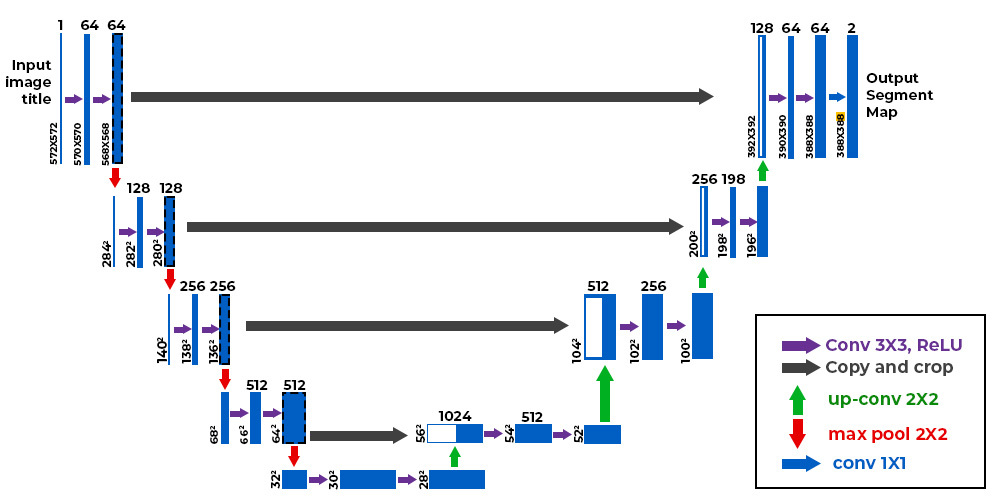

In [27]:
# Conv block: Conv2d -> BatchNorm -> ReLU (2번 반복)
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        return x

In [28]:
# Encoder block: conv_block + maxpool
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv_block = ConvBlock(in_channels, out_channels)
        self.pool = nn.MaxPool2d(2)

    def forward(self, x):
        x = self.conv_block(x)
        p = self.pool(x)
        return x, p

In [29]:
# Decoder block: ConvTranspose2d (upsample) + concat + conv_block
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upconv = nn.ConvTranspose2d(in_channels,out_channels, kernel_size=2, stride=2)
        self.conv_block = ConvBlock(in_channels, out_channels)

    def forward(self, x, skip):
        x = self.upconv(x)
        x = torch.cat([x, skip], dim=1)
        x = self.conv_block(x)
        return x


In [30]:
num_classes = 12

In [31]:
# U-Net 모델 정의 (BatchNorm 추가)
class UNet(nn.Module):
    def __init__(self, num_classes=11):
        super(UNet, self).__init__()

        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),  # BatchNorm 추가
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),  # BatchNorm 추가
                nn.ReLU(inplace=True),
            )

        self.encoder1 = conv_block(3, 64)
        self.encoder2 = conv_block(64, 128)
        self.encoder3 = conv_block(128, 256)

        self.pool = nn.MaxPool2d(2, 2)

        self.bottleneck = conv_block(256, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = conv_block(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = conv_block(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = conv_block(128, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(self.pool(e1))
        e3 = self.encoder3(self.pool(e2))

        b = self.bottleneck(self.pool(e3))

        d3 = self.upconv3(b)
        d3 = torch.cat((d3, e3), dim=1)
        d3 = self.decoder3(d3)

        d2 = self.upconv2(d3)
        d2 = torch.cat((d2, e2), dim=1)
        d2 = self.decoder2(d2)

        d1 = self.upconv1(d2)
        d1 = torch.cat((d1, e1), dim=1)
        d1 = self.decoder1(d1)

        return self.final_conv(d1)  # logits 출력

In [32]:
# 시각화 함수
def visualize_sample(image, true_mask, pred_mask):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image.permute(1, 2, 0))
    plt.title("Input Image")

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask)
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask.argmax(dim=0))
    plt.title("Predicted Mask")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

In [33]:
model = UNet(num_classes=12).to(device)
model

UNet(
  (encoder1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (encoder2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (encoder3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=T

In [34]:
class EarlyStopping:
    def __init__(self, patience=5):
        self.patience = patience
        self.counter = 0
        self.best_loss = float('inf')
        self.early_stop = False
        self.best_model_wts = None

    def step(self, val_loss, model):
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.best_model_wts = model.state_dict()
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

In [35]:
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005, weight_decay=1e-4)
es = EarlyStopping(patience=20)  
epochs = 50

# 평가지표

In [37]:
def compute_metrics(preds, labels, num_classes):
    preds = preds.view(-1)
    labels = labels.view(-1)

    ious = []
    f1_scores = []

    for cls in range(num_classes):
        pred_inds = preds == cls
        label_inds = labels == cls

        intersection = (pred_inds & label_inds).sum().item()
        union = (pred_inds | label_inds).sum().item()
        TP = intersection
        FP = (pred_inds & ~label_inds).sum().item()
        FN = (~pred_inds & label_inds).sum().item()

        iou = intersection / union if union > 0 else float('nan')
        f1 = (2 * TP) / (2 * TP + FP + FN) if (2 * TP + FP + FN) > 0 else float('nan')

        ious.append(iou)
        f1_scores.append(f1)

    mean_iou = np.nanmean(ious)
    mean_f1 = np.nanmean(f1_scores)
    return mean_iou, mean_f1, ious, f1_scores

# Train

In [39]:
def visualize_sample(image, true_mask, pred_mask):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image.permute(1,2,0))  # C,H,W -> H,W,C
    plt.title("Input Image")

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask)
    plt.title("Ground Truth")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask.argmax(dim=0))  # 클래스 채널 중 최대값 위치 표시
    plt.title("Predicted Mask")

    plt.axis("off")
    plt.tight_layout()
    plt.show()

Epoch 1 [Train]: 100%|████████████████████████████| 8/8 [01:13<00:00,  9.21s/it]


Epoch 1, Train Loss: 1.4080, Train Acc: 0.6403, Val Loss: 423.7757, Val Acc: 0.2682


Epoch 2 [Train]: 100%|████████████████████████████| 8/8 [01:16<00:00,  9.56s/it]


Epoch 2, Train Loss: 0.8445, Train Acc: 0.7493, Val Loss: 1.2331, Val Acc: 0.6493


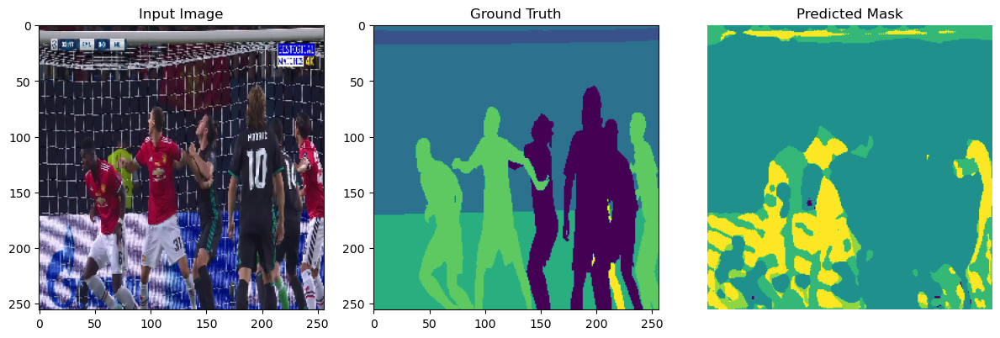

Epoch 3 [Train]: 100%|████████████████████████████| 8/8 [01:14<00:00,  9.27s/it]


Epoch 3, Train Loss: 0.6854, Train Acc: 0.7750, Val Loss: 0.9203, Val Acc: 0.7092


Epoch 4 [Train]: 100%|████████████████████████████| 8/8 [01:18<00:00,  9.76s/it]


Epoch 4, Train Loss: 0.6365, Train Acc: 0.7951, Val Loss: 0.7582, Val Acc: 0.7693


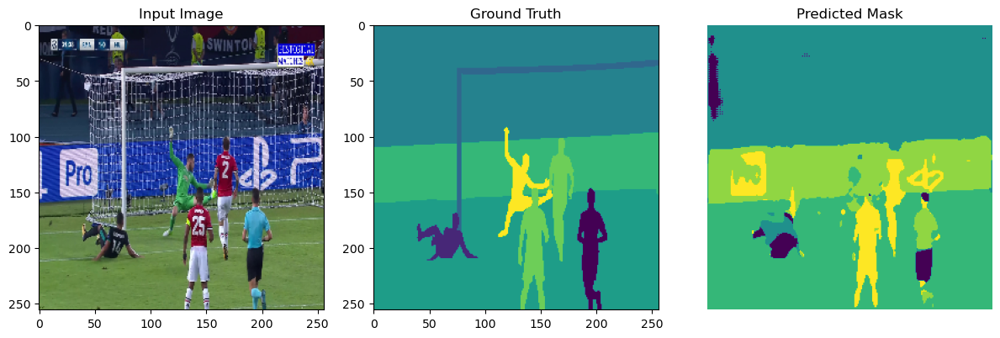

Epoch 5 [Train]: 100%|████████████████████████████| 8/8 [01:21<00:00, 10.17s/it]


Epoch 5, Train Loss: 0.5606, Train Acc: 0.8210, Val Loss: 0.7160, Val Acc: 0.7431


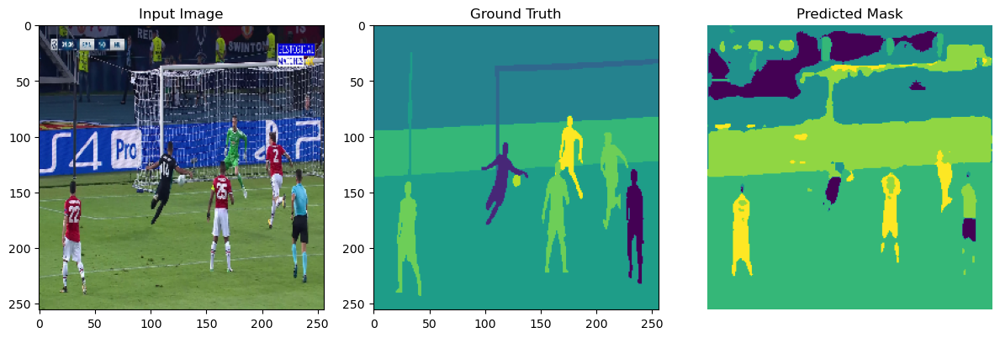

Epoch 6 [Train]: 100%|████████████████████████████| 8/8 [01:15<00:00,  9.47s/it]


Epoch 6, Train Loss: 0.4989, Train Acc: 0.8436, Val Loss: 0.6944, Val Acc: 0.7808


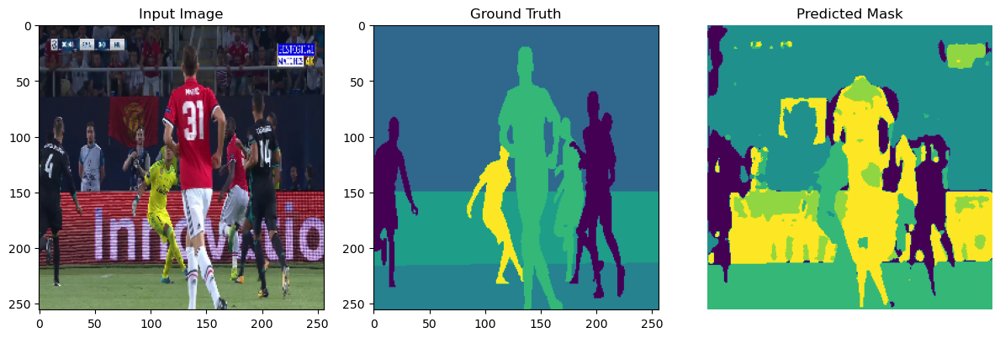

Epoch 7 [Train]: 100%|████████████████████████████| 8/8 [01:19<00:00,  9.97s/it]


Epoch 7, Train Loss: 0.5535, Train Acc: 0.8193, Val Loss: 0.6498, Val Acc: 0.7755


Epoch 8 [Train]: 100%|████████████████████████████| 8/8 [01:23<00:00, 10.50s/it]


Epoch 8, Train Loss: 0.5580, Train Acc: 0.8113, Val Loss: 1.1584, Val Acc: 0.6190


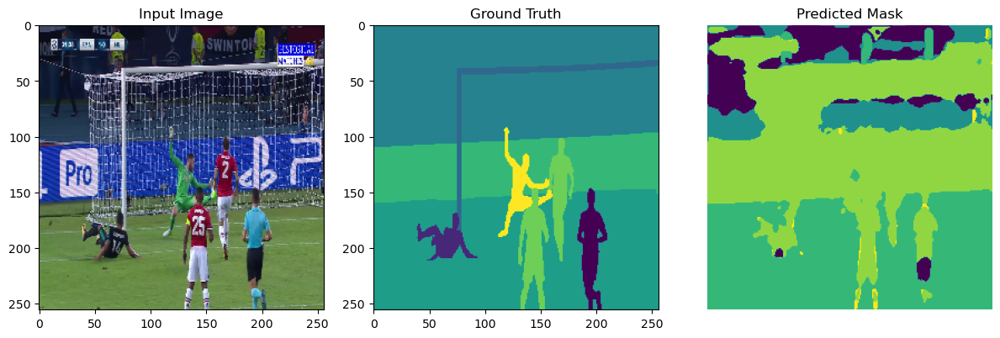

Epoch 9 [Train]: 100%|████████████████████████████| 8/8 [01:25<00:00, 10.72s/it]


Epoch 9, Train Loss: 0.4749, Train Acc: 0.8413, Val Loss: 0.7743, Val Acc: 0.7148


Epoch 10 [Train]: 100%|███████████████████████████| 8/8 [01:27<00:00, 10.92s/it]


Epoch 10, Train Loss: 0.4334, Train Acc: 0.8627, Val Loss: 0.5318, Val Acc: 0.8418


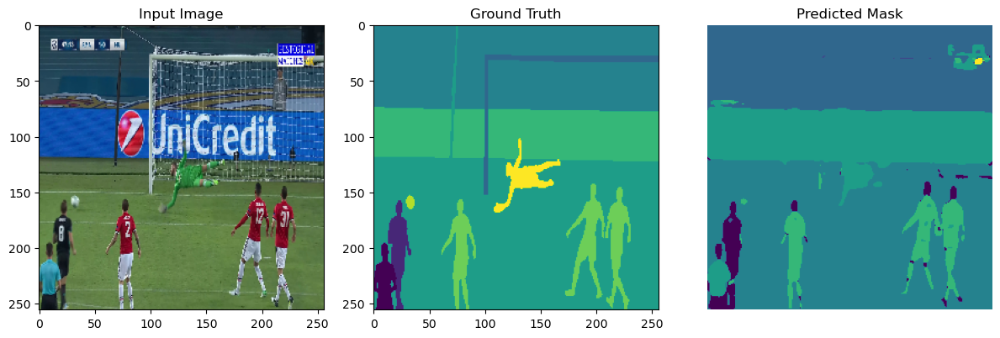

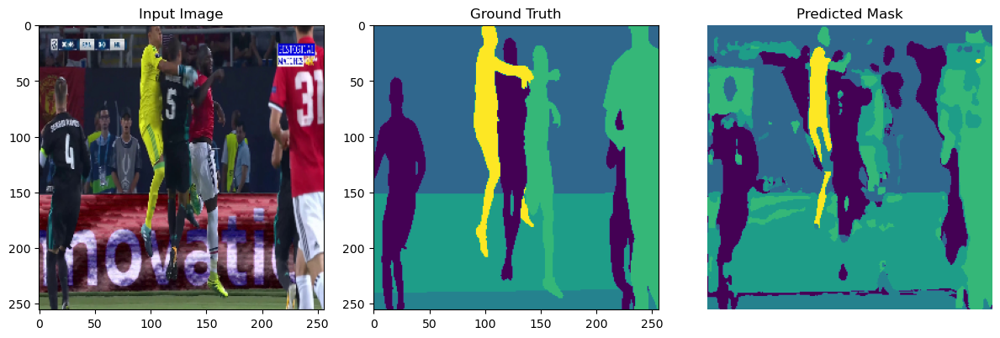

Epoch 11 [Train]: 100%|███████████████████████████| 8/8 [01:24<00:00, 10.58s/it]


Epoch 11, Train Loss: 0.4319, Train Acc: 0.8662, Val Loss: 0.6594, Val Acc: 0.7534


Epoch 12 [Train]: 100%|███████████████████████████| 8/8 [01:48<00:00, 13.55s/it]


Epoch 12, Train Loss: 0.4352, Train Acc: 0.8722, Val Loss: 0.5517, Val Acc: 0.8149


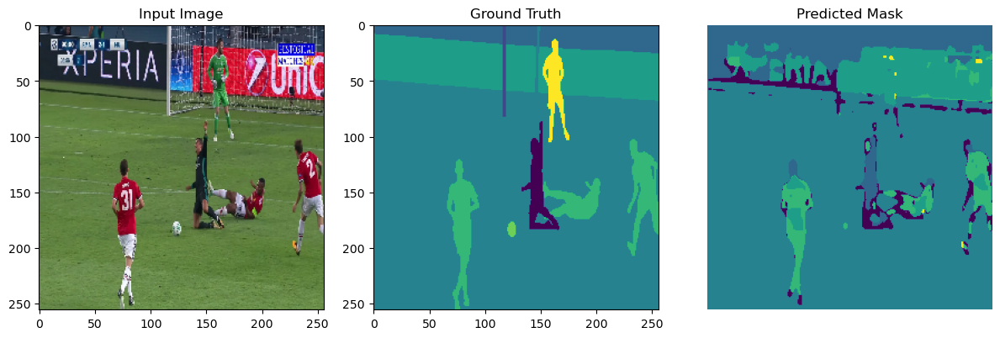

Epoch 13 [Train]: 100%|███████████████████████████| 8/8 [01:42<00:00, 12.80s/it]


Epoch 13, Train Loss: 0.4558, Train Acc: 0.8504, Val Loss: 0.6079, Val Acc: 0.8121


Epoch 14 [Train]: 100%|███████████████████████████| 8/8 [01:30<00:00, 11.37s/it]


Epoch 14, Train Loss: 0.4421, Train Acc: 0.8507, Val Loss: 0.5802, Val Acc: 0.8114


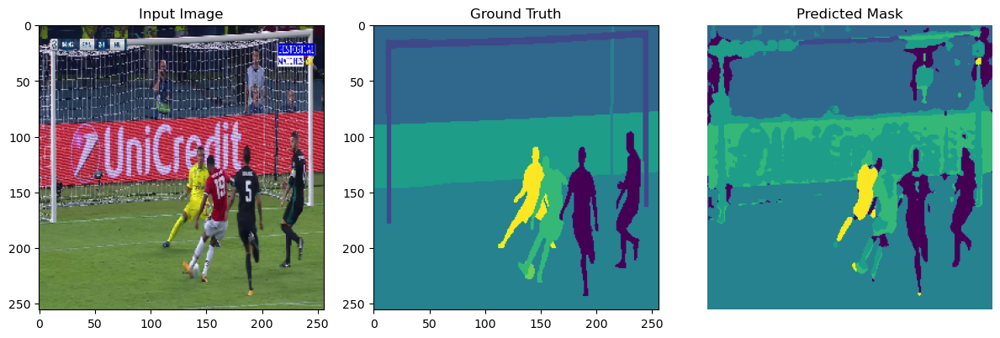

Epoch 15 [Train]: 100%|███████████████████████████| 8/8 [01:50<00:00, 13.81s/it]


Epoch 15, Train Loss: 0.4095, Train Acc: 0.8682, Val Loss: 0.4927, Val Acc: 0.8420


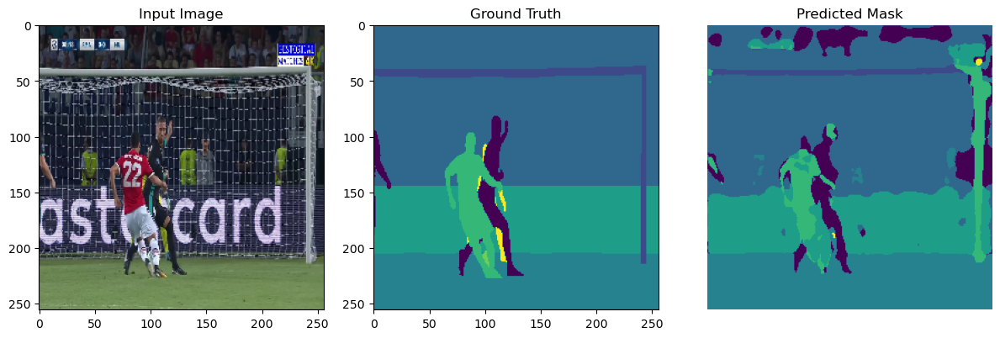

Epoch 16 [Train]: 100%|███████████████████████████| 8/8 [01:31<00:00, 11.47s/it]


Epoch 16, Train Loss: 0.3680, Train Acc: 0.8846, Val Loss: 0.5533, Val Acc: 0.8237


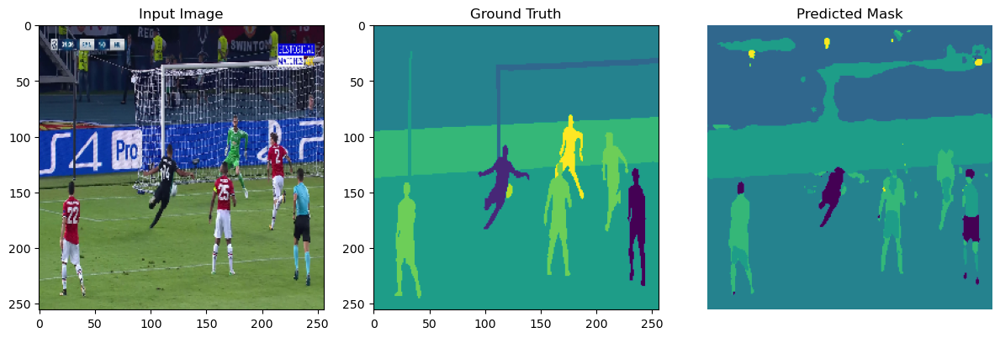

Epoch 17 [Train]: 100%|███████████████████████████| 8/8 [01:35<00:00, 11.90s/it]


Epoch 17, Train Loss: 0.3422, Train Acc: 0.8897, Val Loss: 0.6588, Val Acc: 0.7622


Epoch 18 [Train]: 100%|███████████████████████████| 8/8 [01:29<00:00, 11.20s/it]


Epoch 18, Train Loss: 0.3576, Train Acc: 0.8871, Val Loss: 0.4071, Val Acc: 0.8776


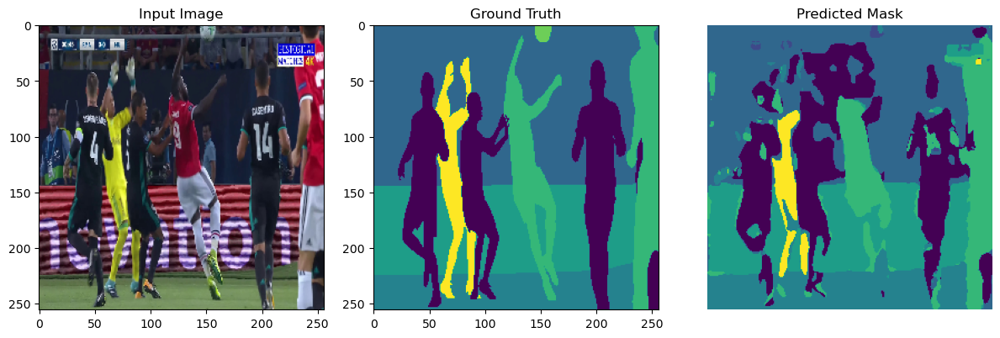

Epoch 19 [Train]: 100%|███████████████████████████| 8/8 [01:34<00:00, 11.76s/it]


Epoch 19, Train Loss: 0.3450, Train Acc: 0.8925, Val Loss: 0.4613, Val Acc: 0.8434


Epoch 20 [Train]: 100%|███████████████████████████| 8/8 [01:29<00:00, 11.22s/it]


Epoch 20, Train Loss: 0.3604, Train Acc: 0.8900, Val Loss: 0.8333, Val Acc: 0.7304


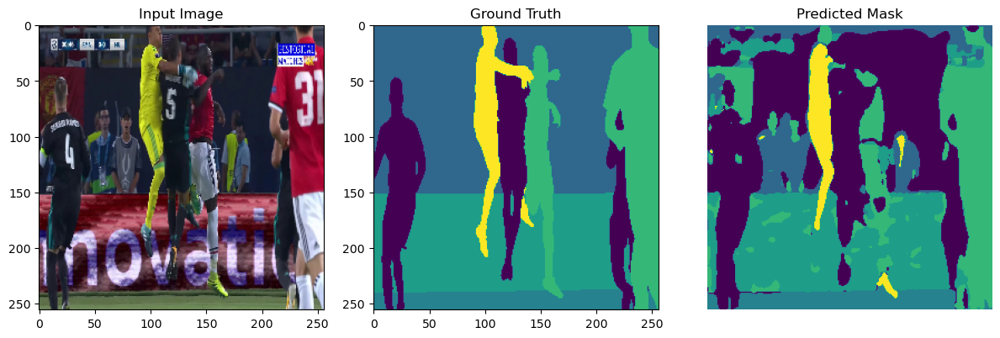

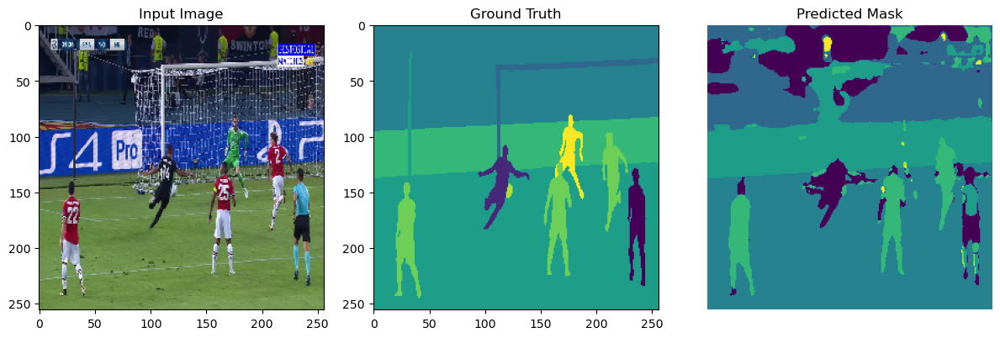

Epoch 21 [Train]: 100%|███████████████████████████| 8/8 [01:28<00:00, 11.01s/it]


Epoch 21, Train Loss: 0.3338, Train Acc: 0.8951, Val Loss: 0.3341, Val Acc: 0.8955


Epoch 22 [Train]: 100%|███████████████████████████| 8/8 [01:23<00:00, 10.46s/it]


Epoch 22, Train Loss: 0.3092, Train Acc: 0.9048, Val Loss: 0.5974, Val Acc: 0.8283


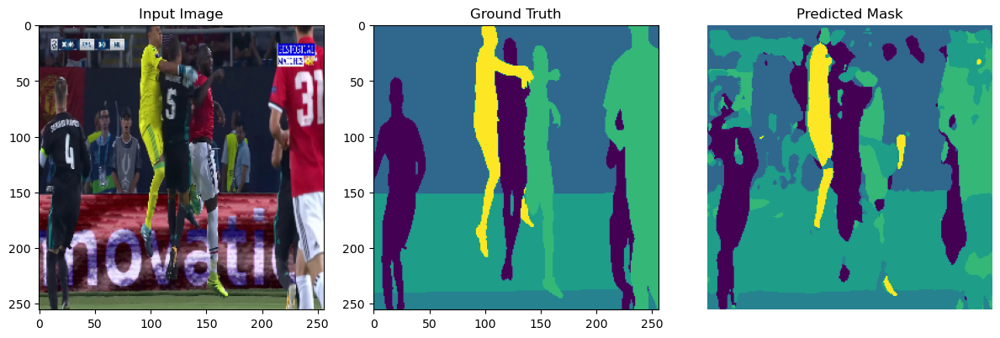

Epoch 23 [Train]: 100%|███████████████████████████| 8/8 [01:21<00:00, 10.15s/it]


Epoch 23, Train Loss: 0.3413, Train Acc: 0.8972, Val Loss: 0.3245, Val Acc: 0.8946


Epoch 24 [Train]: 100%|███████████████████████████| 8/8 [01:22<00:00, 10.31s/it]


Epoch 24, Train Loss: 0.3300, Train Acc: 0.8953, Val Loss: 0.3917, Val Acc: 0.8747


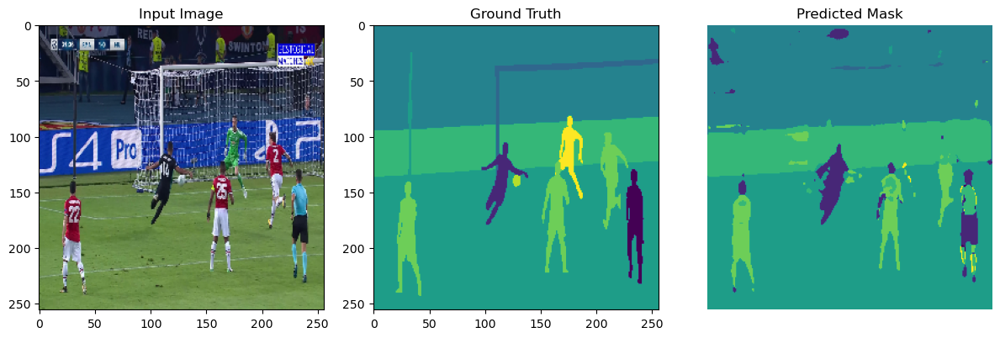

Epoch 25 [Train]: 100%|███████████████████████████| 8/8 [01:37<00:00, 12.14s/it]


Epoch 25, Train Loss: 0.4053, Train Acc: 0.8756, Val Loss: 1.0690, Val Acc: 0.6927


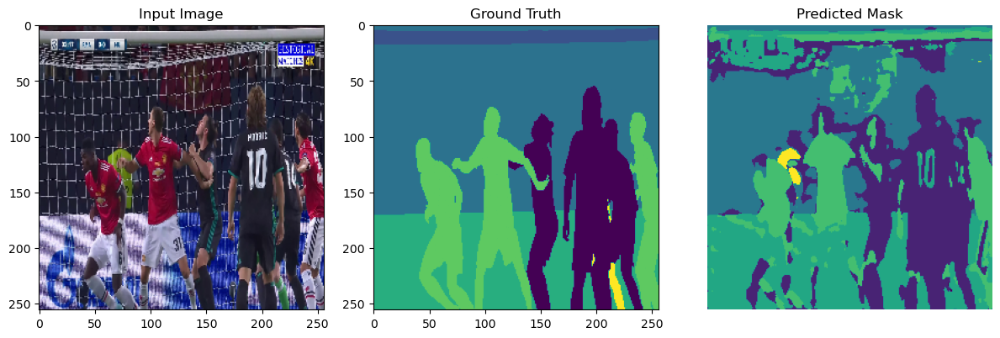

Epoch 26 [Train]: 100%|███████████████████████████| 8/8 [01:22<00:00, 10.28s/it]


Epoch 26, Train Loss: 0.3814, Train Acc: 0.8866, Val Loss: 0.8028, Val Acc: 0.7144


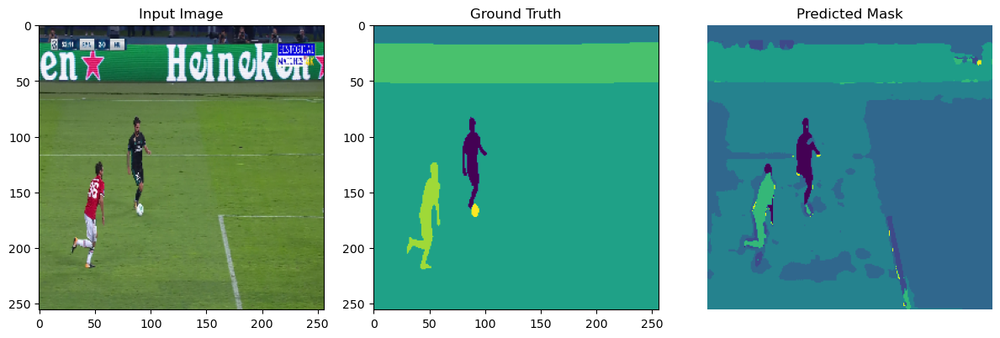

Epoch 27 [Train]: 100%|███████████████████████████| 8/8 [01:26<00:00, 10.87s/it]


Epoch 27, Train Loss: 0.3289, Train Acc: 0.8936, Val Loss: 0.3800, Val Acc: 0.8800


Epoch 28 [Train]: 100%|███████████████████████████| 8/8 [01:32<00:00, 11.62s/it]


Epoch 28, Train Loss: 0.3736, Train Acc: 0.8787, Val Loss: 0.4062, Val Acc: 0.8719


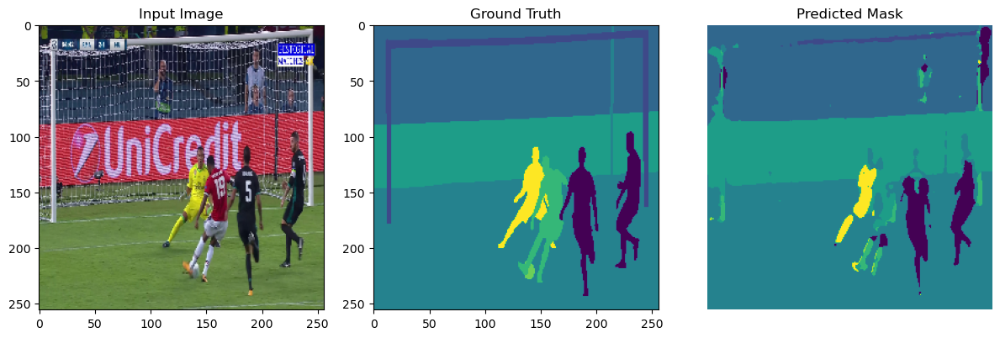

Epoch 29 [Train]: 100%|███████████████████████████| 8/8 [01:35<00:00, 11.92s/it]


Epoch 29, Train Loss: 0.3039, Train Acc: 0.9034, Val Loss: 0.3587, Val Acc: 0.8826


Epoch 30 [Train]: 100%|███████████████████████████| 8/8 [01:22<00:00, 10.33s/it]


Epoch 30, Train Loss: 0.2657, Train Acc: 0.9159, Val Loss: 0.5496, Val Acc: 0.8086


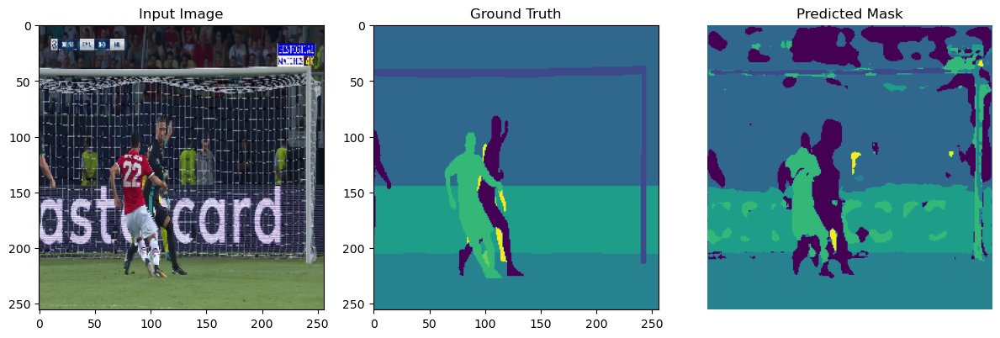

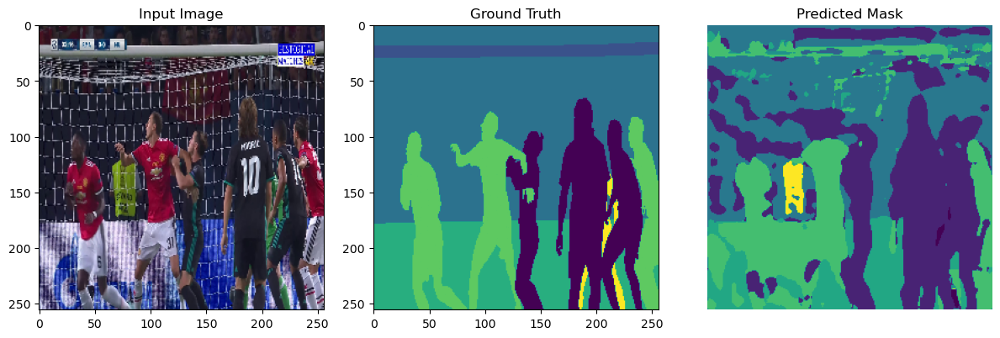

Epoch 31 [Train]: 100%|███████████████████████████| 8/8 [01:24<00:00, 10.57s/it]


Epoch 31, Train Loss: 0.2805, Train Acc: 0.9141, Val Loss: 0.5650, Val Acc: 0.8000


Epoch 32 [Train]: 100%|███████████████████████████| 8/8 [01:27<00:00, 10.95s/it]


Epoch 32, Train Loss: 0.2738, Train Acc: 0.9108, Val Loss: 0.4833, Val Acc: 0.8444


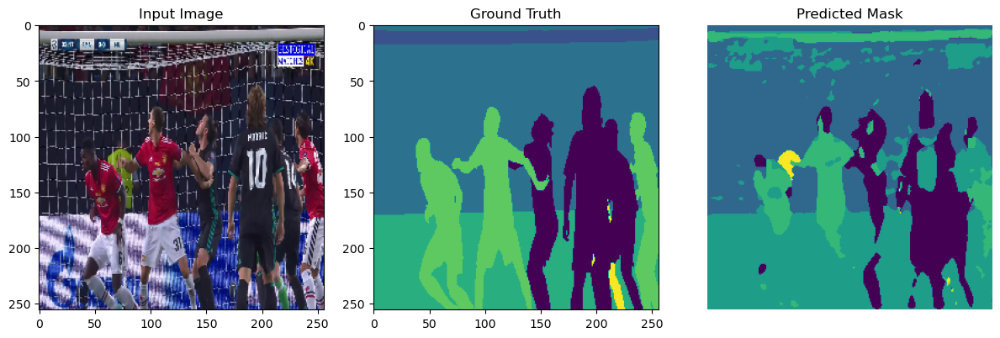

Epoch 33 [Train]: 100%|███████████████████████████| 8/8 [01:18<00:00,  9.77s/it]


Epoch 33, Train Loss: 0.2669, Train Acc: 0.9179, Val Loss: 0.2878, Val Acc: 0.9099


Epoch 34 [Train]: 100%|███████████████████████████| 8/8 [01:18<00:00,  9.79s/it]


Epoch 34, Train Loss: 0.2513, Train Acc: 0.9244, Val Loss: 0.2562, Val Acc: 0.9215


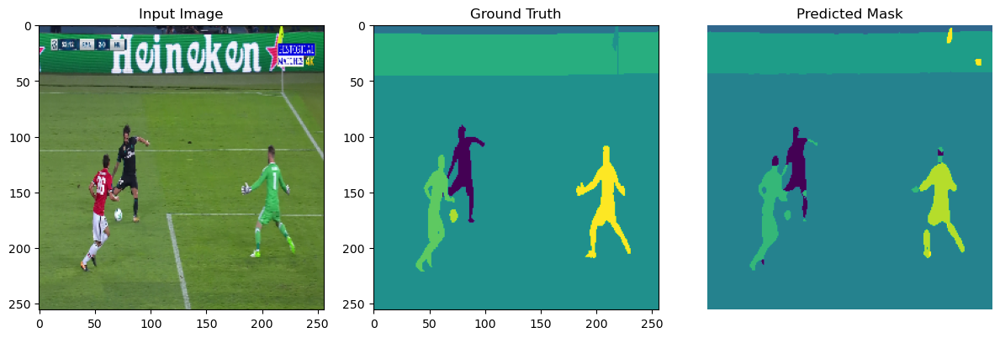

Epoch 35 [Train]: 100%|███████████████████████████| 8/8 [01:13<00:00,  9.20s/it]


Epoch 35, Train Loss: 0.2489, Train Acc: 0.9220, Val Loss: 1.2573, Val Acc: 0.7761


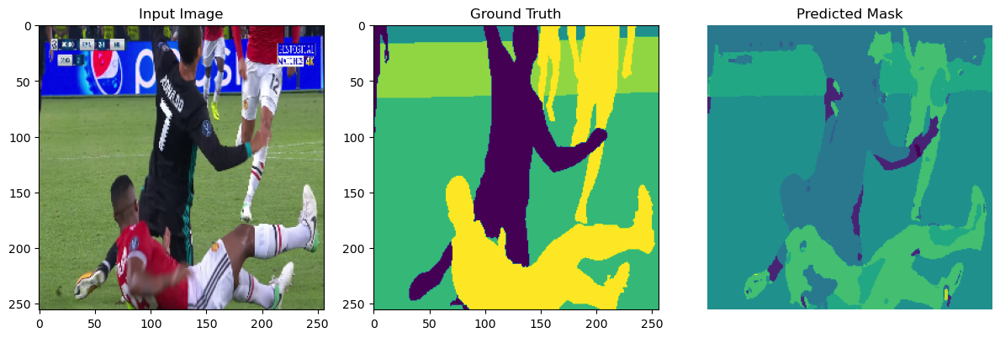

Epoch 36 [Train]: 100%|███████████████████████████| 8/8 [01:15<00:00,  9.46s/it]


Epoch 36, Train Loss: 0.3091, Train Acc: 0.9075, Val Loss: 0.4165, Val Acc: 0.8757


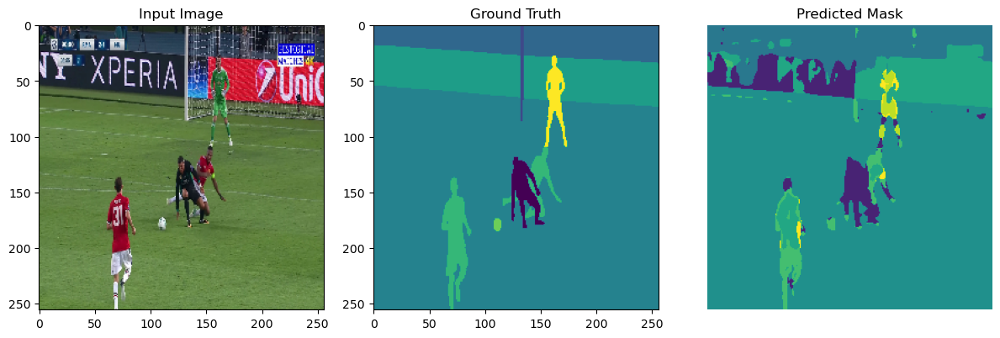

Epoch 37 [Train]: 100%|███████████████████████████| 8/8 [01:20<00:00, 10.10s/it]


Epoch 37, Train Loss: 0.3437, Train Acc: 0.8923, Val Loss: 0.3457, Val Acc: 0.8873


Epoch 38 [Train]: 100%|███████████████████████████| 8/8 [01:22<00:00, 10.29s/it]


Epoch 38, Train Loss: 0.3030, Train Acc: 0.9059, Val Loss: 0.6276, Val Acc: 0.7882


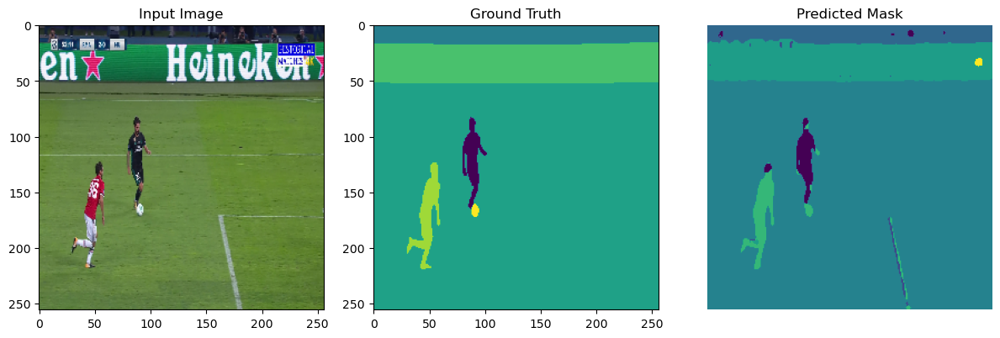

Epoch 39 [Train]: 100%|███████████████████████████| 8/8 [01:22<00:00, 10.30s/it]


Epoch 39, Train Loss: 0.2801, Train Acc: 0.9108, Val Loss: 0.3082, Val Acc: 0.9126


Epoch 40 [Train]: 100%|███████████████████████████| 8/8 [01:21<00:00, 10.22s/it]


Epoch 40, Train Loss: 0.2712, Train Acc: 0.9170, Val Loss: 0.2791, Val Acc: 0.9133


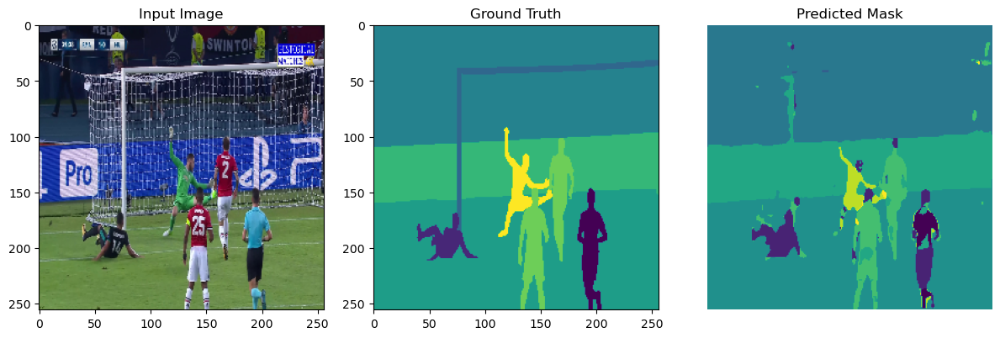

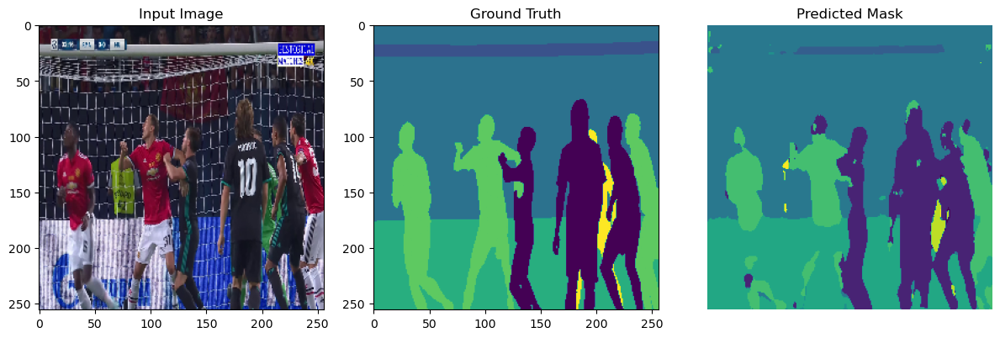

Epoch 41 [Train]: 100%|███████████████████████████| 8/8 [01:41<00:00, 12.65s/it]


Epoch 41, Train Loss: 0.2433, Train Acc: 0.9218, Val Loss: 0.3329, Val Acc: 0.8950


Epoch 42 [Train]: 100%|███████████████████████████| 8/8 [01:16<00:00,  9.51s/it]


Epoch 42, Train Loss: 0.2409, Train Acc: 0.9240, Val Loss: 0.2902, Val Acc: 0.9054


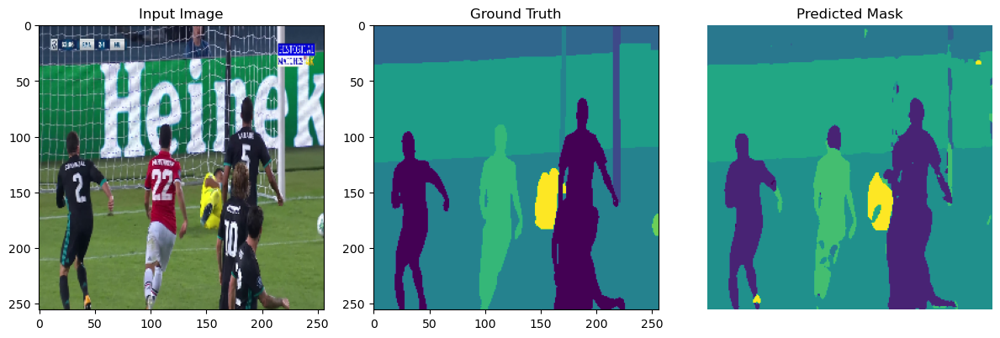

Epoch 43 [Train]: 100%|███████████████████████████| 8/8 [01:17<00:00,  9.68s/it]


Epoch 43, Train Loss: 0.2300, Train Acc: 0.9276, Val Loss: 0.7707, Val Acc: 0.7840


Epoch 44 [Train]: 100%|███████████████████████████| 8/8 [01:15<00:00,  9.50s/it]


Epoch 44, Train Loss: 0.2650, Train Acc: 0.9164, Val Loss: 0.3396, Val Acc: 0.8869


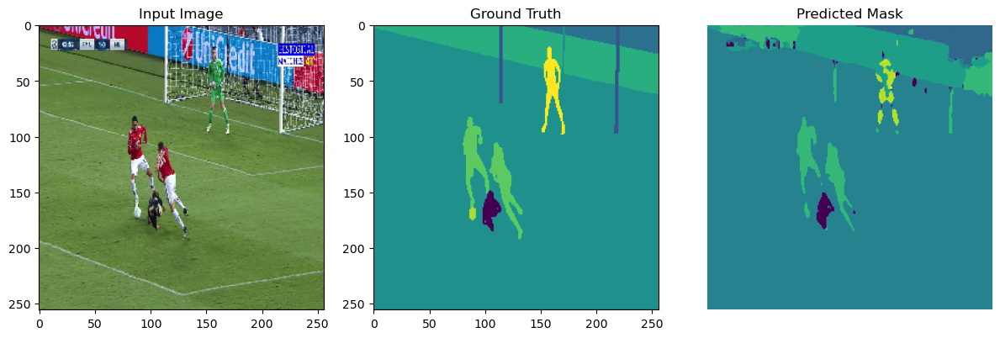

Epoch 45 [Train]: 100%|███████████████████████████| 8/8 [01:24<00:00, 10.54s/it]


Epoch 45, Train Loss: 0.2741, Train Acc: 0.9112, Val Loss: 0.3095, Val Acc: 0.9041


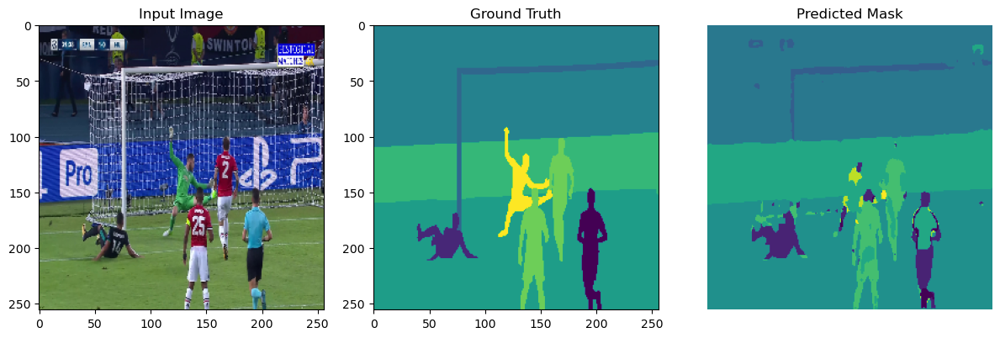

Epoch 46 [Train]: 100%|███████████████████████████| 8/8 [01:20<00:00, 10.11s/it]


Epoch 46, Train Loss: 0.2432, Train Acc: 0.9241, Val Loss: 0.3621, Val Acc: 0.8878


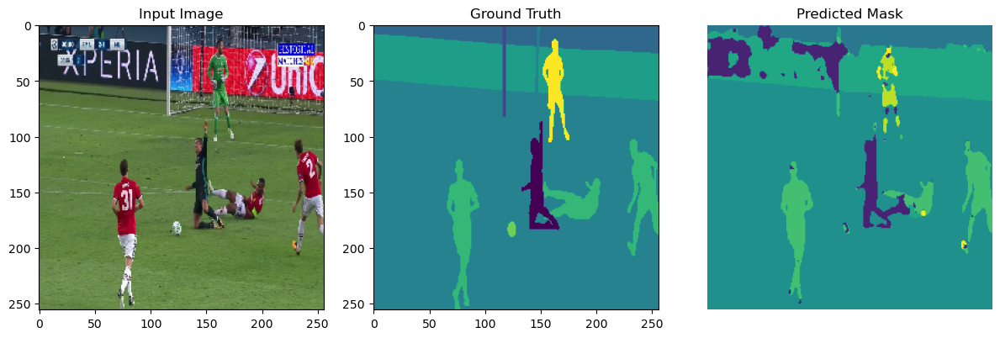

Epoch 47 [Train]: 100%|███████████████████████████| 8/8 [01:22<00:00, 10.28s/it]


Epoch 47, Train Loss: 0.2360, Train Acc: 0.9251, Val Loss: 0.2881, Val Acc: 0.9130


Epoch 48 [Train]: 100%|███████████████████████████| 8/8 [01:22<00:00, 10.26s/it]


Epoch 48, Train Loss: 0.2594, Train Acc: 0.9211, Val Loss: 0.2914, Val Acc: 0.9090


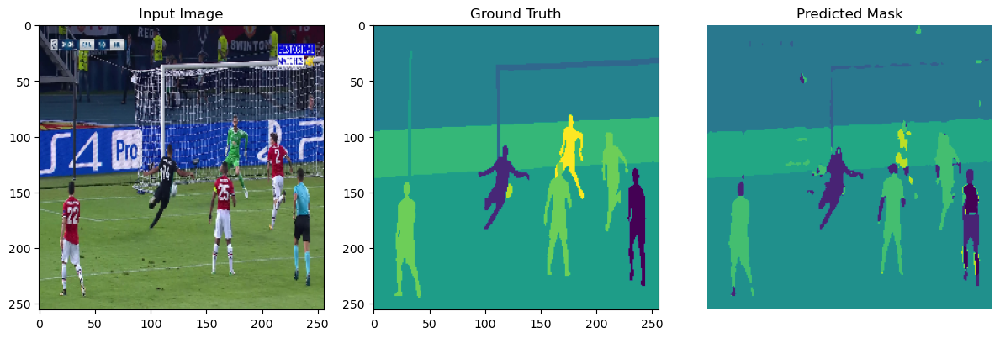

Epoch 49 [Train]: 100%|███████████████████████████| 8/8 [01:22<00:00, 10.29s/it]


Epoch 49, Train Loss: 0.2536, Train Acc: 0.9191, Val Loss: 0.3191, Val Acc: 0.9036


Epoch 50 [Train]: 100%|███████████████████████████| 8/8 [01:23<00:00, 10.41s/it]


Epoch 50, Train Loss: 0.2730, Train Acc: 0.9156, Val Loss: 0.2807, Val Acc: 0.9095


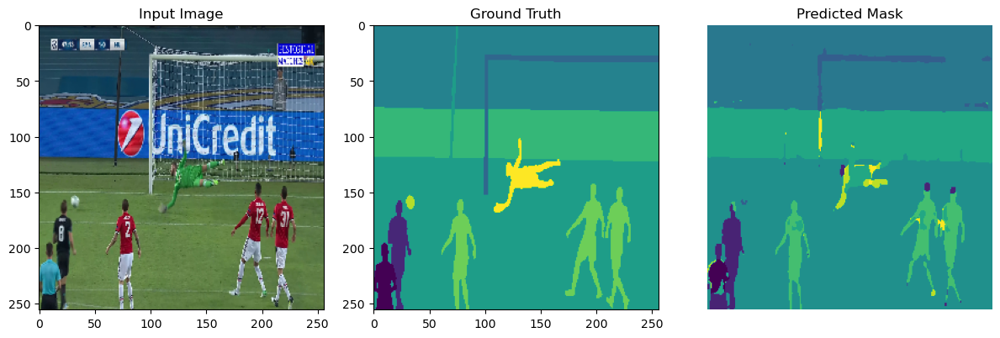

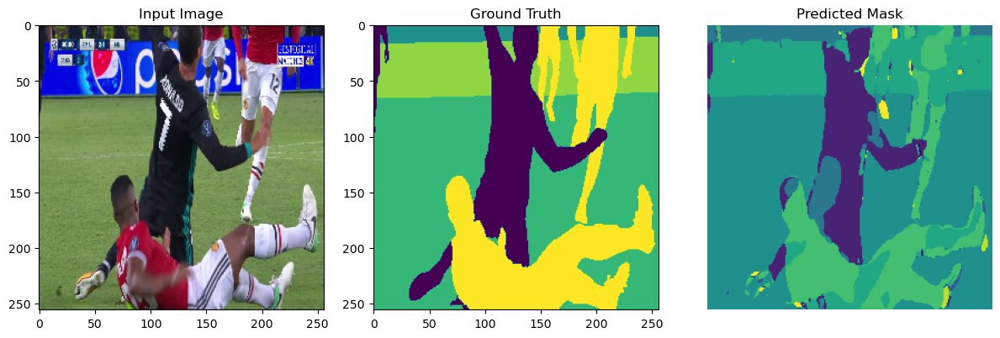

In [40]:
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(epochs):
    model.train()
    correct = 0
    total = 0
    total_loss = 0

    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1} [Train]"):
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = loss_fn(outputs, masks)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)
        if masks.ndim == 4:  # one-hot 마스크 처리
            masks = torch.argmax(masks, dim=1)
        correct += (preds == masks).sum().item()
        total += torch.numel(masks)

    avg_train_loss = total_loss / len(train_loader)
    train_accuracy = correct / total
    train_losses.append(avg_train_loss)
    train_accuracies.append(train_accuracy)

    model.eval()
    val_loss = 0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = loss_fn(outputs, masks)
            val_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)
            if masks.ndim == 4:
                masks = torch.argmax(masks, dim=1)
            val_correct += (preds == masks).sum().item()
            val_total += torch.numel(masks)

    avg_val_loss = val_loss / len(val_loader)
    val_accuracy = val_correct / val_total
    val_losses.append(avg_val_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}, "
          f"Train Loss: {avg_train_loss:.4f}, Train Acc: {train_accuracy:.4f}, "
          f"Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

    es.step(avg_val_loss, model)
    if es.early_stop:
        print("Early stopping!")
        model.load_state_dict(es.best_model_wts)
        break

    if (epoch + 1) % 5 == 0:
        sample_img, sample_mask = val_dataset[np.random.randint(len(val_dataset))]
        model.eval()
        with torch.no_grad():
            pred = model(sample_img.unsqueeze(0).to(device))[0].cpu()
        visualize_sample(sample_img, sample_mask, pred)

    if (epoch + 1) % 2 == 0:
        idx = np.random.randint(len(val_dataset))
        image, true_mask = val_dataset[idx]
        model.eval()
        with torch.no_grad():
            pred_mask = model(image.unsqueeze(0).to(device))[0].cpu()
        visualize_sample(image, true_mask, pred_mask)


In [48]:
def plot_learning_curves(train_losses, val_losses, train_accs, val_accs):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 5))

    # 손실
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss', marker='o')
    plt.plot(epochs, val_losses, label='Val Loss', marker='x')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # 정확도
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accs, label='Train Acc', marker='o')
    plt.plot(epochs, val_accs, label='Val Acc', marker='x')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Accuracy Curve')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

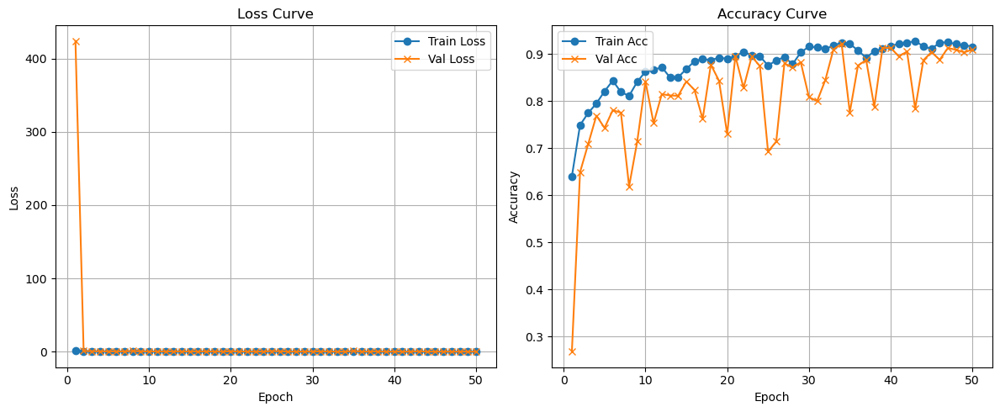

In [50]:
plot_learning_curves(train_losses, val_losses, train_accuracies, val_accuracies)

# 모델 평가

In [54]:
def evaluate_model(model, dataloader, loss_fn, device, num_classes=11):
    model.eval()
    total_loss = 0
    total_batches = len(dataloader)

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc="Evaluating"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = loss_fn(outputs, masks)
            total_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)
            if masks.ndim == 4:
                masks = torch.argmax(masks, dim=1)

            all_preds.append(preds.cpu())
            all_labels.append(masks.cpu())

    avg_loss = total_loss / total_batches

    # 모든 배치에 대해 하나의 텐서로 합치기
    all_preds = torch.cat(all_preds, dim=0)
    all_labels = torch.cat(all_labels, dim=0)

    mean_iou, mean_f1, ious, f1_scores = compute_metrics(all_preds, all_labels, num_classes)

    print(f"\nEvaluation Loss: {avg_loss:.4f}")
    print(f"Mean IoU: {mean_iou:.4f}")
    print(f"Mean F1-score (Dice): {mean_f1:.4f}")
    return avg_loss, mean_iou, mean_f1


In [56]:
def visualize_predictions(model, dataset, num_samples=5, device='cuda'):
    model.eval()
    for i in range(num_samples):
        idx = np.random.randint(len(dataset))
        image, true_mask = dataset[idx]

        # 전처리: (C, H, W) → (1, C, H, W)
        input_tensor = image.unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(input_tensor)[0].cpu()  # (C, H, W)

        pred_mask = torch.argmax(output, dim=0)  # (H, W)
        true_mask = true_mask if true_mask.ndim == 2 else torch.argmax(true_mask, dim=0)

        # 시각화
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(image.permute(1, 2, 0).cpu())
        plt.title("Input Image")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(true_mask.cpu(), cmap='jet')
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask.cpu(), cmap='jet')
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

Evaluating: 100%|███████████████████████████████| 20/20 [00:08<00:00,  2.23it/s]



Evaluation Loss: 0.2848
Mean IoU: 0.4939
Mean F1-score (Dice): 0.5944


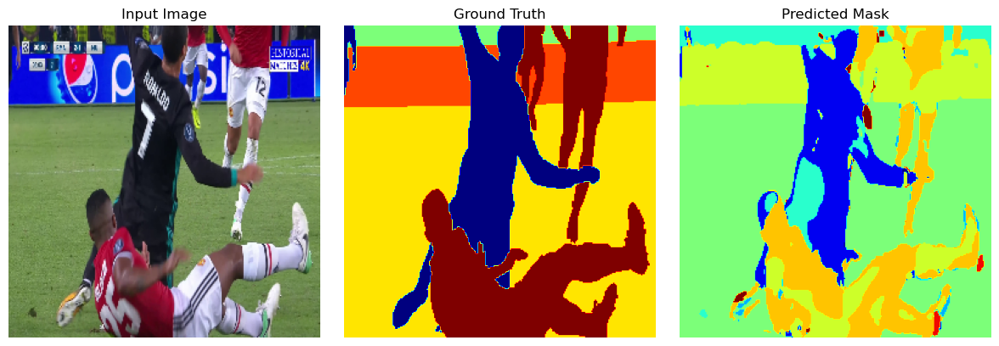

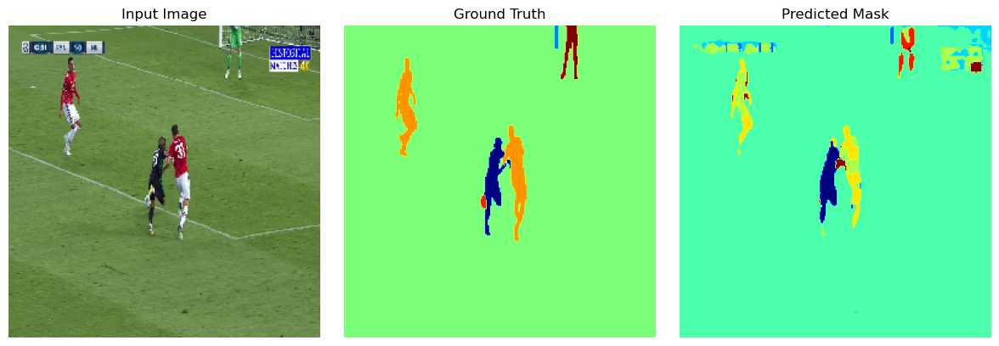

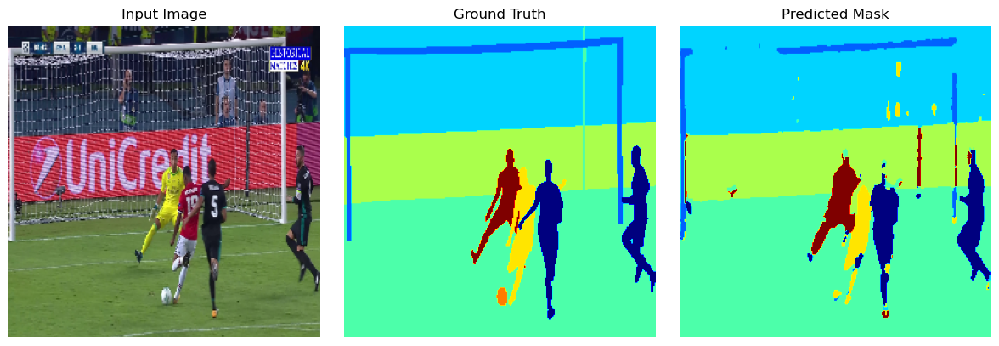

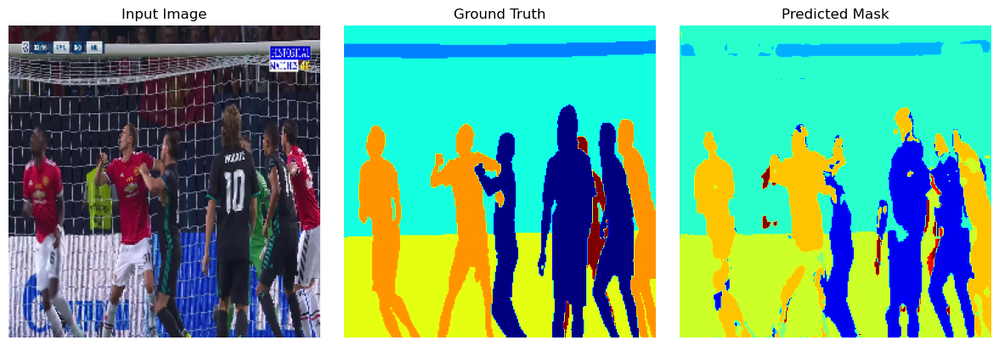

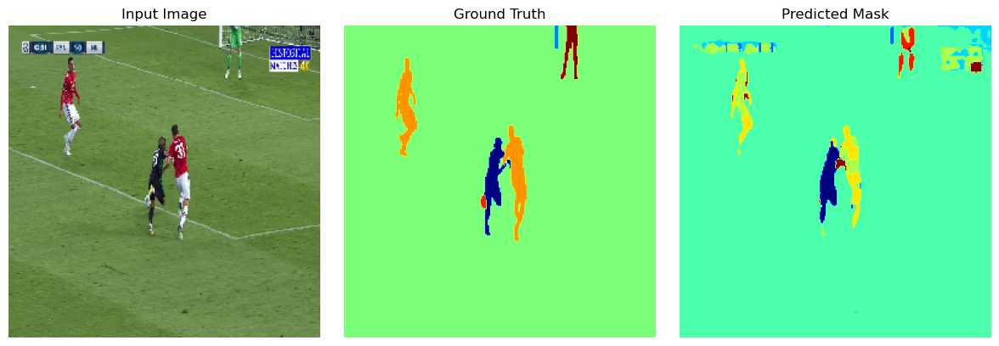

In [58]:
# 평가 (loss + mIoU + F1-score)
evaluate_model(model, test_loader, loss_fn, device, num_classes=11)


# 시각화 (랜덤 샘플)
visualize_predictions(model, test_dataset, num_samples=5, device=device)